In [2]:
import numpy as np 
from matplotlib import pyplot as plt
from PIL import Image

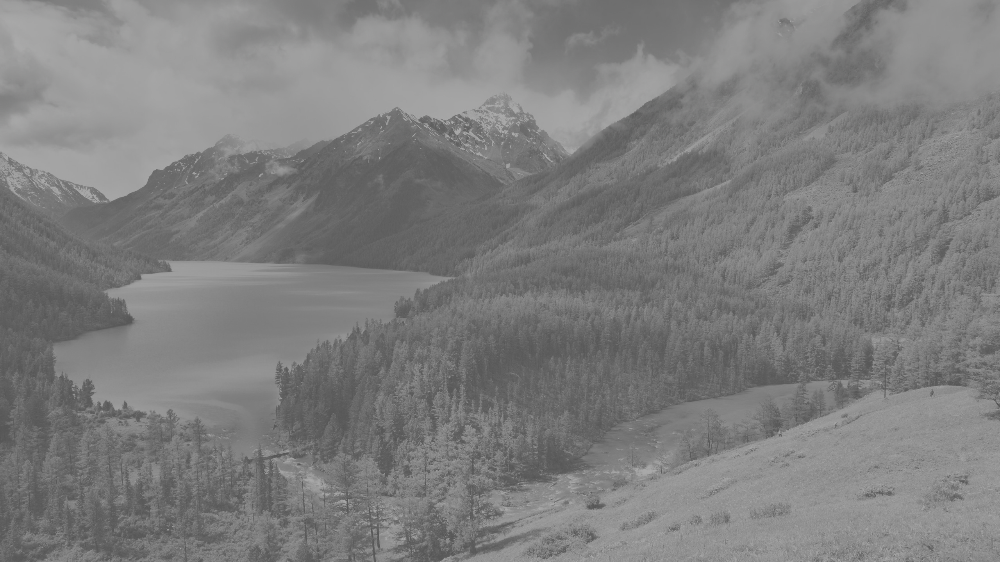

In [5]:
display(Image.open("image.png"))

# GrayScale Image Creation

In [79]:
#this function will build our grayscale imag using YUV constant coefficients to calculate the brightness level
def yuv_gray_scale(image):
    c1 = 0.257 
    c2 = 0.504
    c3 = 0.098 
    image_gray = np.arange(0,(image.shape[0]*image.shape[1])).reshape(image.shape[0],image.shape[1])
    for i in range(0,image.shape[0]):
        for j in range(0,image.shape[1]):
            image_gray[i,j] = image[i,j,0]*c1 + image[i,j,1]*c2 + image[i,j,2]*c3 + 16

    return image_gray

def image_gray_scale(source):
    #image reading from source
    image =  np.array(Image.open(source))
    #using YUV
    image_gray = yuv_gray_scale(image)
    #saving image
    Image.fromarray(image).convert('L').save("grayscale.png")

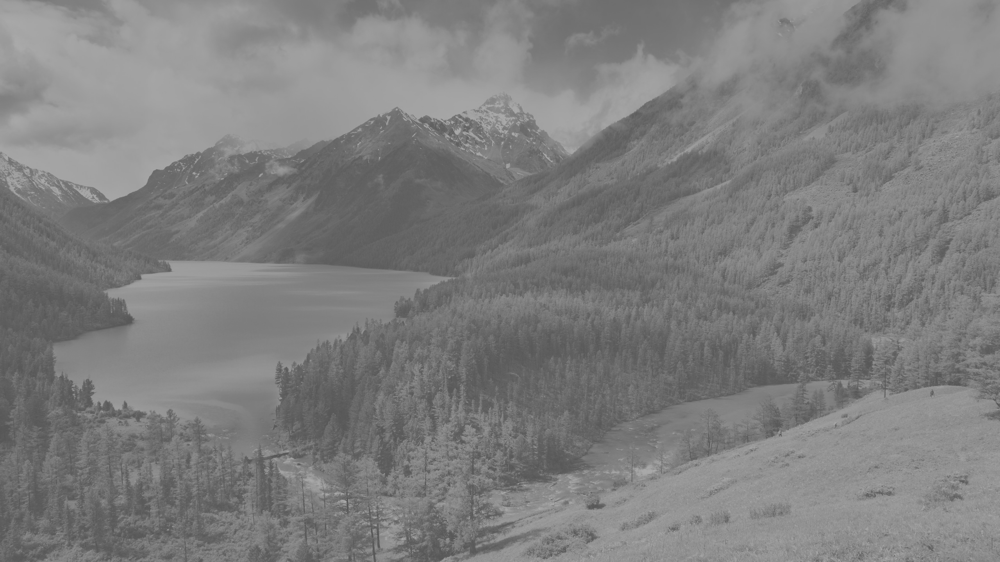

In [80]:
#creating grayscaled image 
image_gray_scale("image.png")
display(Image.open("grayscale.png"))
image =  np.array(Image.open("grayscale.png"))

In [82]:
#this function will help us to plot main image and cumsum and mapped images histogram
def bar_function(X,Y,title,x_lable,y_lable,subplot_num1,subplot_num2,subplot_num3):
    plt.subplot(subplot_num1,subplot_num2,subplot_num3)
    plt.plot(X,Y)
    plt.title(title)
    plt.xlabel(x_lable)
    plt.ylabel(y_lable)
    plt.show()

# Histogram Calculation

In [83]:
#here we are counting histogram rates per pixel for main image
def histogram_rate_plot(image):
    rgb_rate = np.arange(0,256)
    histogram = np.arange(0,256)*0
    for i in range(0,image.shape[0]):
        for j in range(0,image.shape[1]):
            histogram[image[i,j]] += 1
    bar_function(rgb_rate,histogram,"Histogram","range","pixel count",2,2,3) 
    return histogram

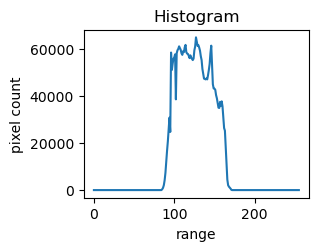

In [84]:
histogram = histogram_rate_plot(image)

# Histogram Cumulative Sum

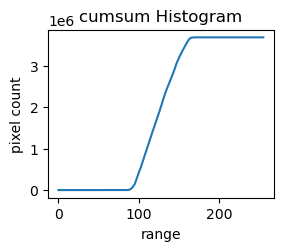

In [85]:
def cumulative_sum(histogram):
    #here we are calculating cumulative_sum for histogram with cumsum from numpy
    histogram_cumulative_sum = np.cumsum(histogram)
    #plotting the result
    rgb_rate = np.arange(0,256)
    bar_function(rgb_rate,histogram_cumulative_sum,"cumsum Histogram","range","pixel count",2,2,3) 
    
    return histogram_cumulative_sum

histogram_cumulative_sum = cumulative_sum(histogram)

In [71]:
def map_histogram(map_rate , histogram_cumulative_sum , image):
    
    #mapping histogram with map_rate
    mapped_histogram = np.round((map_rate) * histogram_cumulative_sum / (image.shape[0] * image.shape[1]))
    
    #CUMSUM OF mapped_histogram
    cumulative_sum(mapped_histogram)
    
    #plotting mapped_histogram
    rgb_rate = np.arange(0,256)
    bar_function(rgb_rate,histogram_cumulative_sum,f"Mapped Histogram(rate = map_rate)","range","pixel count",2,2,3) 
    
    #lets apply the map histogram to image
    new_image = image.copy()
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            #here we will find critical image color rate and replace it with new mapped histogram color
            new_image[i,j] = mapped_histogram[image[i,j]] 
    
    #saving result
    saving_path = f"histogram_equlized_{map_rate}.png"
    Image.fromarray(new_image).convert('L').save(saving_path)
    print(f"histogram equlized result{map_rate}")
    display(Image.open(saving_path))
    

# Mapping new Histogram to Image

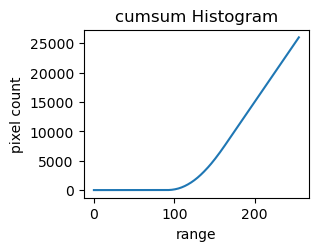

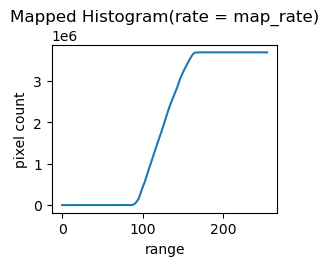

histogram equlized result200


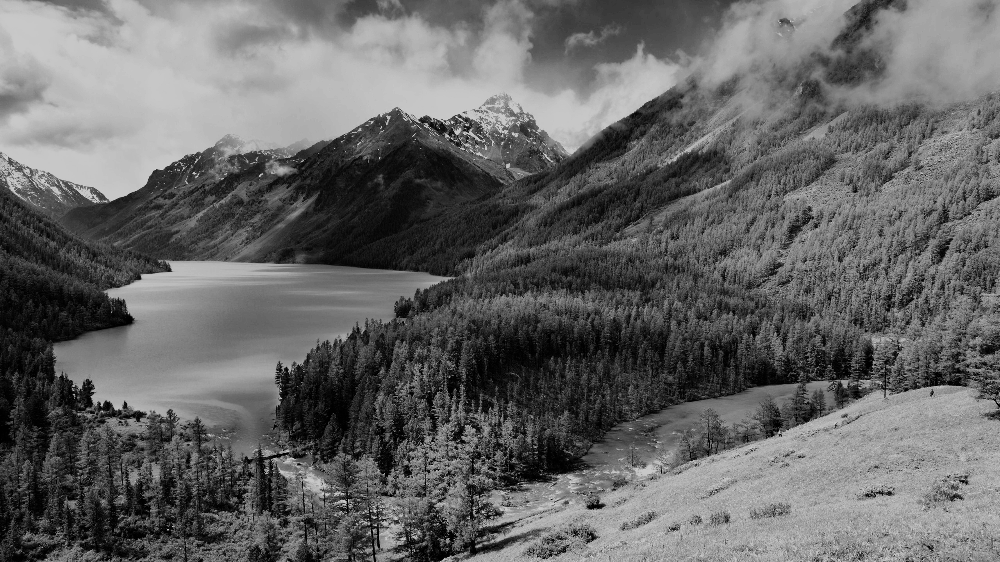

In [86]:
map_histogram(200 , histogram_cumulative_sum , image)

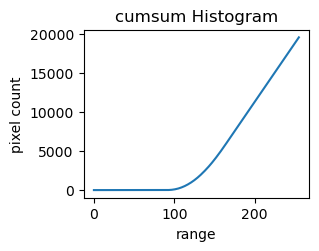

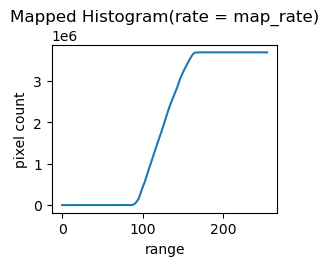

histogram equlized result150


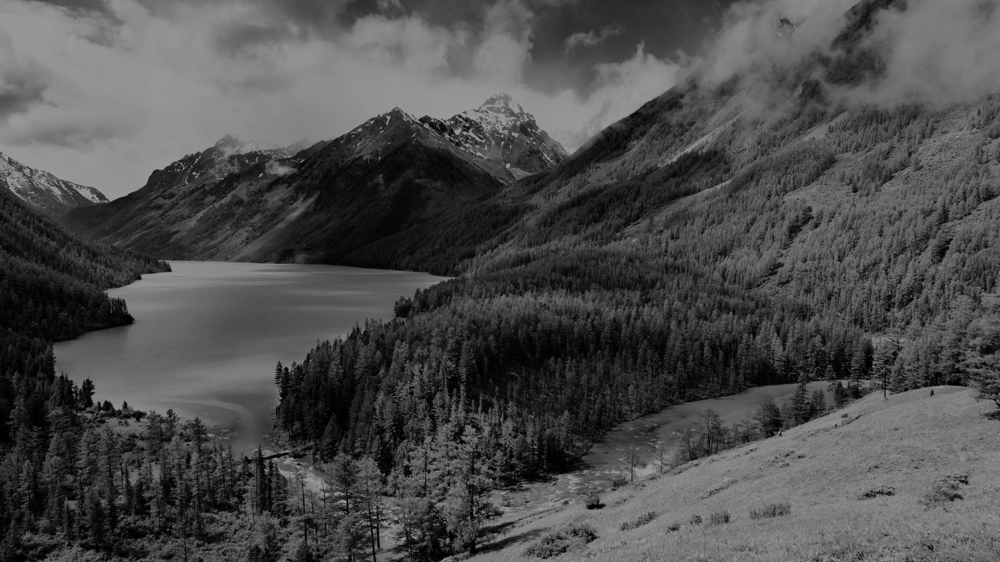

In [87]:
map_histogram(150 , histogram_cumulative_sum , image)

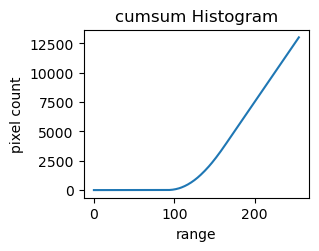

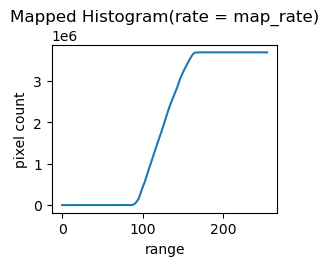

histogram equlized result100


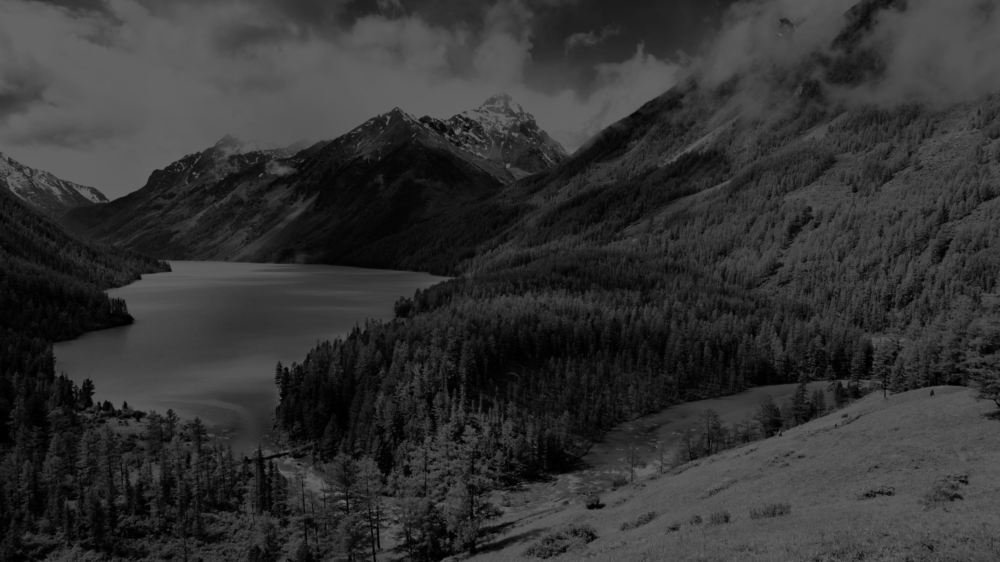

In [88]:
map_histogram(100 , histogram_cumulative_sum , image)

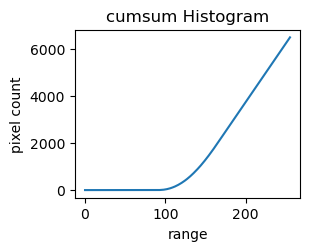

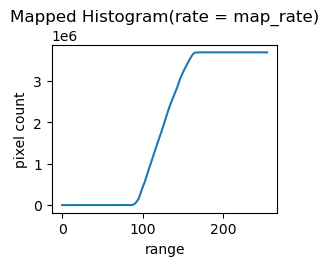

histogram equlized result50


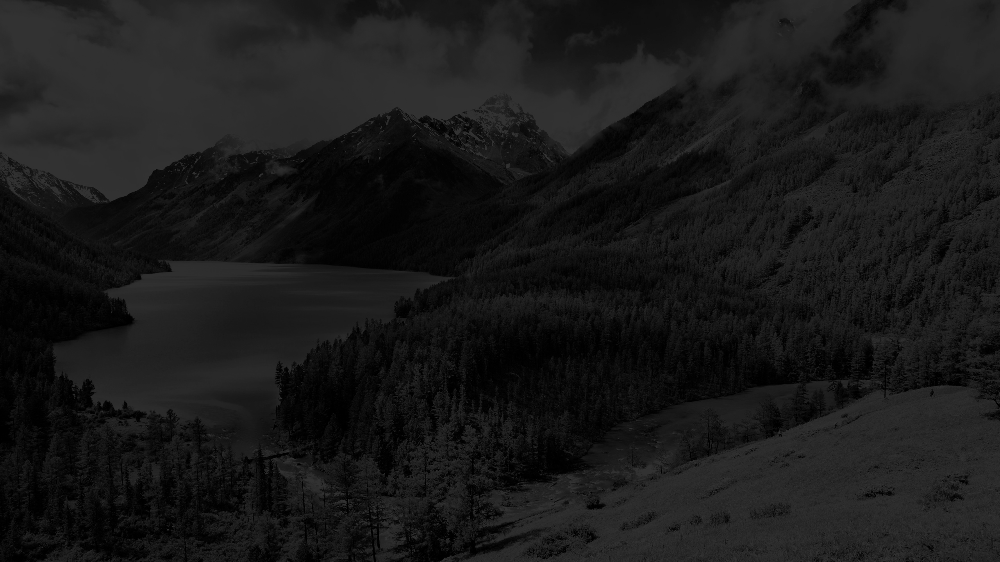

In [89]:
map_histogram(50 , histogram_cumulative_sum , image)